<a href="https://colab.research.google.com/github/MistyDi/RTSD-Traffic-Sign-Classification/blob/master/main_script_EN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline

import cv2

from keras.preprocessing.image import img_to_array
from keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint, EarlyStopping

import sklearn.metrics as metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

from skimage import transform
from skimage import exposure

import seaborn as sb
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import matplotlib.image as mpimg

import random
import os

Using TensorFlow backend.


##RTSD data is uploaded to Google Drive as Zip-file
Connecting the project to Google Drive and unzipping:

In [0]:
from google.colab import drive
drive.mount('/content/drive')

from zipfile import ZipFile
zip_base_name = "/content/drive/My Drive/Colab Notebooks/Bases/RTSD classification.zip"
with ZipFile(zip_base_name, 'r') as zip:
    zip.extractall()
    print('Unzipping is done')

In [0]:
def plot_class_percent_bar(fig, series_class_counts, 
                           title: str, xlabel: str, ylabel: str, fig_name: str,
                           fontsize: int=12,
                           color='lightseagreen', edgecolor='lightseagreen'):
    plt.tight_layout()
    plt.style.use(['classic'])  # 'classic' | 'dark_background'
    fig.set_facecolor('w')
    
    bars = series_class_counts.plot.bar(color=color, edgecolor=edgecolor)

    totals = []
    for bar in bars.patches:
        totals.append(bar.get_height())
    total = sum(totals)

    ymin, ymax = bars.get_ylim()
    bars.set_ylim(top=ymax*1.1)

    # set individual bar lables using above list
    for bar in bars.patches:
        bar_height = bar.get_height()
        plt.text(bar.get_x(), bar_height + ymax*0.02,
                str(round((bar_height/total)*100, 2)) + "%",
                fontsize=fontsize, color=color, rotation=90)
        
    plt.title(title, color='k', fontsize=20)
    plt.xlabel(xlabel, color='k', fontsize=16)
    plt.ylabel(ylabel, color='k', fontsize=16)
    try:
        fig.savefig(fig_name)
        print(f"Saved to the: {fig_name}")
    except Exception as e:
        print('ERROR: Unsuccessfull saving')
        print(e)

Examples of classes names of RTSD-r1:


,class_number,sign_class,name
0,0,1_1,Ж/д пеерезд со шлагбаумом
1,1,1_11_1,Опасный поворот (направо)


,class_number,sign_class,name
65,65,4_2_3,Объезд препятствия справа или слева
66,66,4_3,Круговое движение



Number of classes in RTSD-r1: 67
Shape of RTSD-r1 labels DataFrame: (32983, 2)
Saved to the: /content/drive/My Drive/Colab Notebooks/Results/CourseWork/EN/r1_base_en.png

Examples of classes names of RTSD-r3:


,class_number,sign_class
0,0,1_1
1,1,1_11


,class_number,sign_class
104,104,7_6
105,105,7_7



Number of classes in RTSD-r3: 106
Shape of RTSD-r3 labels DataFrame: (93654, 2)
Saved to the: /content/drive/My Drive/Colab Notebooks/Results/CourseWork/EN/r3_base_en.png


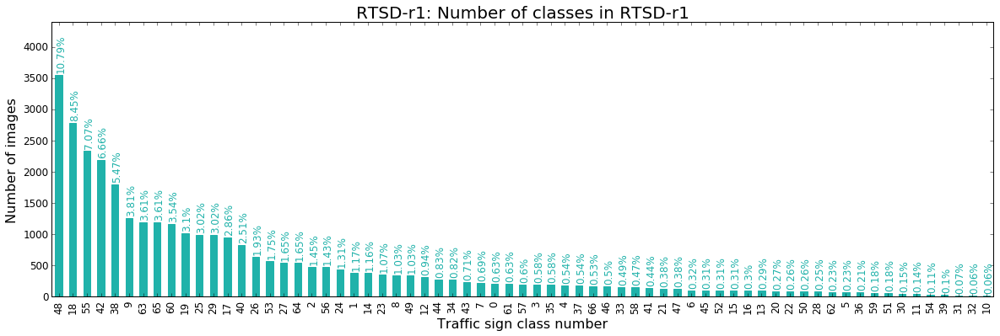

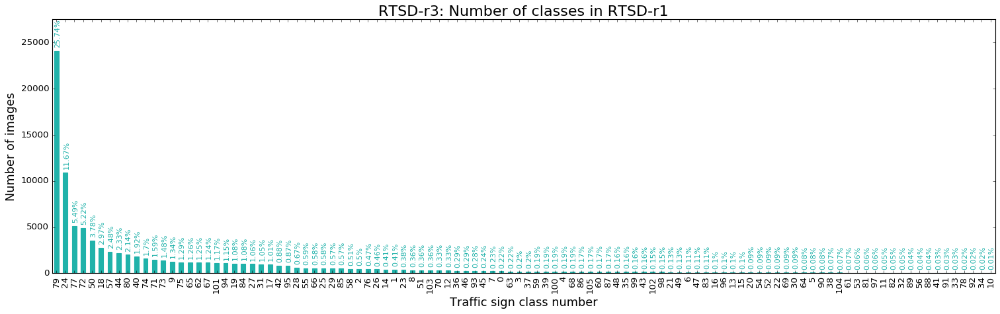

In [4]:
results_path = '/content/drive/My Drive/Colab Notebooks/Results/CourseWork/EN'
r1_path = '/content/RTSD classification/rtsd-r1/'

classes_names_df_r1 = pd.ExcelFile('/content/drive/My Drive/Colab Notebooks/Bases/numbers_to_classes.xlsx')
# classes_names_df_r1 = pd.ExcelFile(r1_path + 'numbers_to_classes.xlsx')
classes_names_df_r1 = classes_names_df_r1.parse(sheet_name=0)
print("Examples of classes names of RTSD-r1:")
display(classes_names_df_r1.head(2))
display(classes_names_df_r1.tail(2))

n_classes = classes_names_df_r1['class_number'].count()
print("\nNumber of classes in RTSD-r1: " + str(n_classes))  # -> 67

labels_df = pd.ExcelFile(r1_path + 'gt_data.xlsx')
labels_df = labels_df.parse(sheet_name=0)
labels_df['filename'] = r1_path + 'train/' + labels_df['filename']
r1_class_counts = labels_df['class_number'].value_counts()
print(f'Shape of RTSD-r1 labels DataFrame: {labels_df.shape}')


fig = plt.figure(figsize=(20, 6))
title = 'RTSD-r1: Number of classes in RTSD-r1'
xlabel = 'Traffic sign class number'
ylabel = 'Number of images'
fig_name = results_path + '/r1_base_en.png'
plot_class_percent_bar(fig, r1_class_counts, title, xlabel, ylabel, fig_name)

# ------------------------------------------------------------------------------

r3_path = '/content/RTSD classification/rtsd-r3/'
classes_names_df_r3 = pd.read_csv(r3_path + 'numbers_to_classes.csv')
# classes_names_df_r3 = pd.ExcelFile(r3_path + 'numbers_to_classes.xlsx')
# classes_names_df_r3 = classes_names_df_r3.parse(sheet_name=0)
print("\nExamples of classes names of RTSD-r3:")
display(classes_names_df_r3.head(2))
display(classes_names_df_r3.tail(2))

n_classes_r3 = classes_names_df_r3['class_number'].count()
print("\nNumber of classes in RTSD-r3: " + str(n_classes_r3))  # -> 106

labels_df_r3 = pd.ExcelFile(r3_path + 'gt_data.xlsx')
labels_df_r3 = labels_df_r3.parse(sheet_name=0)
labels_df_r3['filename'] = r3_path + 'train/' + labels_df_r3['filename']
print(f'Shape of RTSD-r3 labels DataFrame: {labels_df_r3.shape}')
r3_class_counts = labels_df_r3['class_number'].value_counts()

fig = plt.figure(figsize=(23, 6))
title = 'RTSD-r3: Number of classes in RTSD-r1'
xlabel = 'Traffic sign class number'
ylabel = 'Number of images'
fig_name = results_path + '/r3_base_en.png'
plot_class_percent_bar(fig, r3_class_counts, title, xlabel, ylabel, fig_name, fontsize=10)


## RTSD-r1 visualisation

###Number of images per class

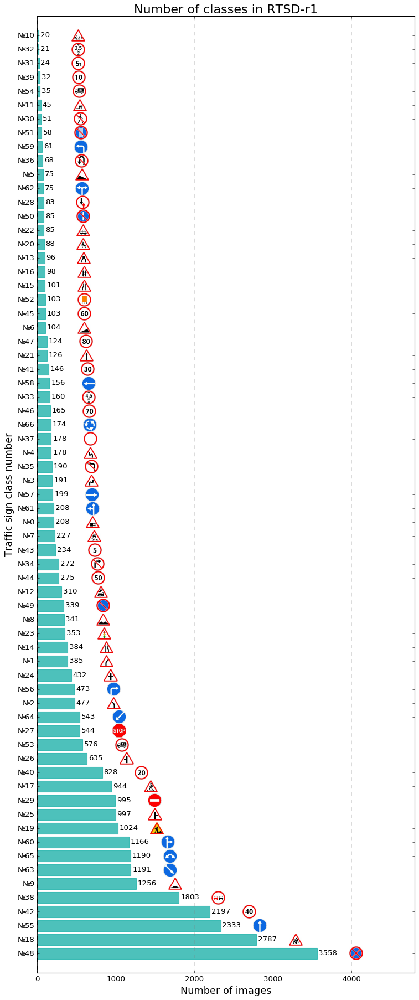

In [5]:
# REQUIREMENTS:
# from matplotlib.offsetbox import OffsetImage, AnnotationBbox
# import matplotlib.image as mpimg

orig_signs_folder_path = '/content/drive/My Drive/Colab Notebooks/Bases/signs_original'

# pd.Series with indices (numbers of rows) like a str (string) type
y_bar_nums = r1_class_counts.index.astype(str)

y_bar_labels = (('№' + y_bar_nums).to_numpy(dtype=str))
x_bar_labels = r1_class_counts.to_numpy()

fig, ax = plt.subplots(figsize=(11, 27))
plt.style.use(['classic'])
fig.set_facecolor('w')

bar_graphs = ax.barh(y_bar_labels, x_bar_labels, 0.8, 
                     edgecolor='lightseagreen', 
                     color='lightseagreen', alpha=0.8)

# graph grid on x axis
ax.xaxis.grid(True, linestyle='--', which='major', color='grey', alpha=0.5)

# 30% x ixis zooming on right
xmin, xmax = ax.get_xlim()
ax.set_xlim((xmin, xmax*1.2))

# y axis zooming by 1 bar size on left and right
ymin, ymax = ax.get_ylim()
ax.set_ylim(bottom=ymin-1, top=ymax+1)

for i, bar in enumerate(bar_graphs):
    # bar - is an object of Rectangle class
    # Rectangle class has methods like get_width(), get_height(), etc...
    w, h = bar.get_width(), bar.get_height()
    
    # coordinates of left bottom edge
    x0, y0 = bar.xy
    
    # display of original traffic signs image near each bar
    path = orig_signs_folder_path + '/' + y_bar_nums[i] + '.jpg'
    arr_img = mpimg.imread(path)
    imagebox = OffsetImage(arr_img, zoom=0.45)

    # center of image is 500 points to the right of the bar's end and in the middle of bar thickness
    ab = AnnotationBbox(imagebox, (x0 + w + 500, y0 + h/2), frameon=False)
    ax.add_artist(ab)

    # display the number of images 20 points to the right of the bar's end
    label = x_bar_labels[i]
    plt.text(x = x0 + w + 20 , y = y0 + h/2 - 0.1, s = label, size = 12)
    
plt.title('Number of classes in RTSD-r1', color='k', fontsize=20)
plt.ylabel('Traffic sign class number', color='k', fontsize=16)
plt.xlabel('Number of images', color='k', fontsize=16)

fig_name = results_path + '/r1_fancy_bar_en.png'
fig.savefig(fig_name, dpi=300)

In [0]:
def load_data(imgs_paths: list, width: int, height: int, 
              n_classes: int=0, num_labels: list=[]):
    # REQUIRED:
    # import keras.utils.to_categorical
    # import cv2
    
    data = []
    data_len = imgs_paths.shape[0]

    for i in range(data_len):
        image = cv2.imread(imgs_paths[i])
        sized_image = cv2.resize(image, (width, height))
        sized_image = cv2.cvtColor(sized_image, cv2.COLOR_BGR2RGB)
        # sized_image = cv2.cvtColor(sized_image, cv2.COLOR_RGB2GRAY)

        data.append(img_to_array(sized_image))
        
    data = np.array(data, dtype="float") / 255.0

    # if list num_labels is not empty (len(num_labels) != 0 -> True)
    if num_labels:
        # converting labels to vector labels. 2 -> [0 0 1 0 0 ... 0]
        labels = to_categorical(num_labels, num_classes=n_classes)
        return data, labels

    else:  # if list num_labels is empty (num_labels == [] -> True)
        return data

###Examples of images 

Saved to the: /content/drive/My Drive/Colab Notebooks/Results/CourseWork/EN/ImagesSamples_en.png


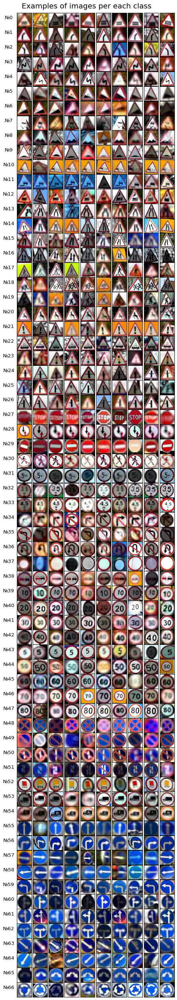

In [7]:
height = 48
width = 48
channels = 3  # RGB images
n_samples = 10  # number of columns

fig = plt.figure(figsize=((n_samples + 2)*0.5, (n_classes + 2)*0.5))
fig.subplots_adjust(left=0.1, right=1, bottom=0, top=0.97, hspace=0.005, wspace=0.005)
plt.style.use(['classic'])
fig.set_facecolor('w')

for row_i in range(n_classes):

    # filter-mask with class number row_i
    temp_filter = labels_df["class_number"] == row_i
    
    # random samples (with n_samples images) with row_i class
    temp = labels_df.where(temp_filter)['filename'].dropna().sample(n=n_samples, random_state=1)

    # loading images from pathes in temp to numpy.ndarray()
    temp_imgs = load_data(temp.to_numpy(), width, height, n_classes=n_classes)
    
    # print(temp_imgs[0].shape)
    for col_i in range(n_samples):
        ax = fig.add_subplot(n_classes, n_samples, 
                             row_i*10 + col_i + 1, xticks=[], yticks=[])
        
        ax.imshow(temp_imgs[col_i])
        
        # if first column, then print a ylabel with the number of class
        if col_i == 0:
            row_text = '№' + str(row_i)

            # labelpad should be selected manually (labelpad - space between beginning of ylabel and yaxis)
            ax.set_ylabel(row_text, rotation=0, labelpad=20) 

fig.suptitle('Examples of images per each class', color='k', fontsize=18)
# plt.tight_layout()

fig_name = results_path + '/ImagesSamples_en.png'
try:
    fig.savefig(fig_name)
    print(f"Saved to the: {fig_name}")
except Exception as e:
    print('ERROR: Unsuccessfull saving')
    print(e)

###Wrong labels. RTSD-r1 problems

In [0]:
def plot_signs_class(fig, paths_df: pd.DataFrame, class_num: int, width, height,
                     save_path: str='', n_cols: int=16):
    fig.set_facecolor('w')
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.03, wspace=0)

    filtered_indices = paths_df["class_number"] == class_num
    temp = paths_df.where(filtered_indices)['filename'].dropna()
    temp_imgs = load_data(temp.to_numpy(), width, height)
    
    n_imgs = temp_imgs.shape[0]
    n_rows = int(round(temp_imgs.shape[0]/n_cols + 0.5, 0) + 1)
    
    fig.set_size_inches(n_cols*0.8, n_rows)

    i = 0
    ax = fig.add_subplot(n_rows, n_cols, i+1, xticks=[], yticks=[])
    i += n_cols
    
    ax.imshow(mpimg.imread(orig_signs_folder_path + '/' + str(class_num) + '.jpg'))
    ax.set_title(f'№{class_num}', fontsize=12) 

    for i_col in range(n_imgs):
        i += 1
        ax = fig.add_subplot(n_rows, n_cols, i, xticks=[], yticks=[])
        ax.imshow(temp_imgs[i_col])
        row_text = i_col
        ax.set_title(row_text, fontsize=12) 

    plt.tight_layout()

    if save_path:
        try:
            fig.savefig(save_path)
            print(f"Saved to the: {save_path}")
        except Exception as e:
            print('ERROR: Unsuccessfull saving')
            print(e)
    return temp

Saved to the: /content/drive/My Drive/Colab Notebooks/Results/CourseWork/EN/Class_49_en.png
Saved to the: /content/drive/My Drive/Colab Notebooks/Results/CourseWork/EN/Class_1_en.png
Saved to the: /content/drive/My Drive/Colab Notebooks/Results/CourseWork/EN/Class_2_en.png


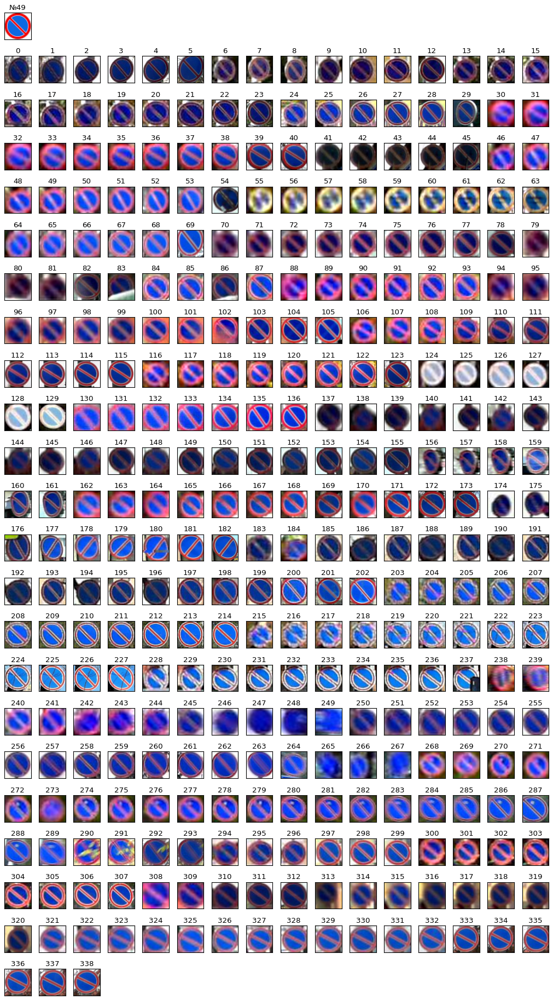

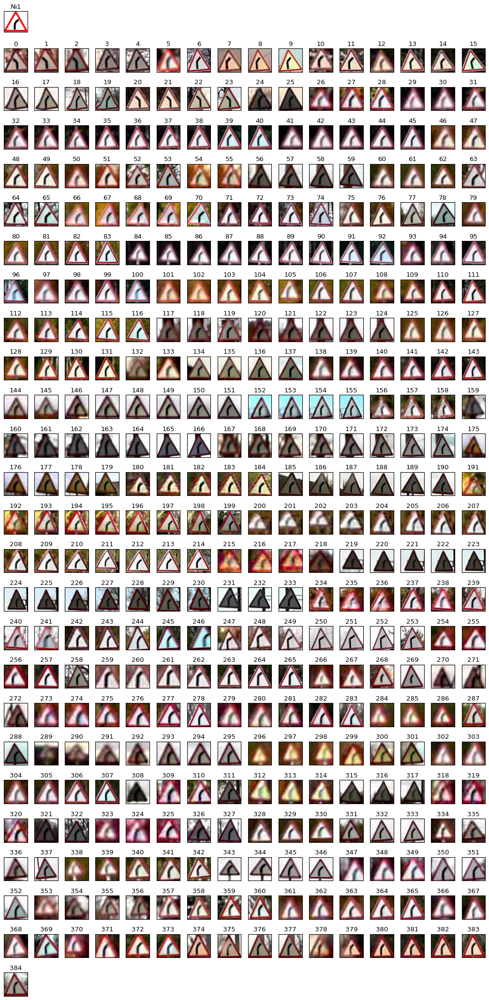

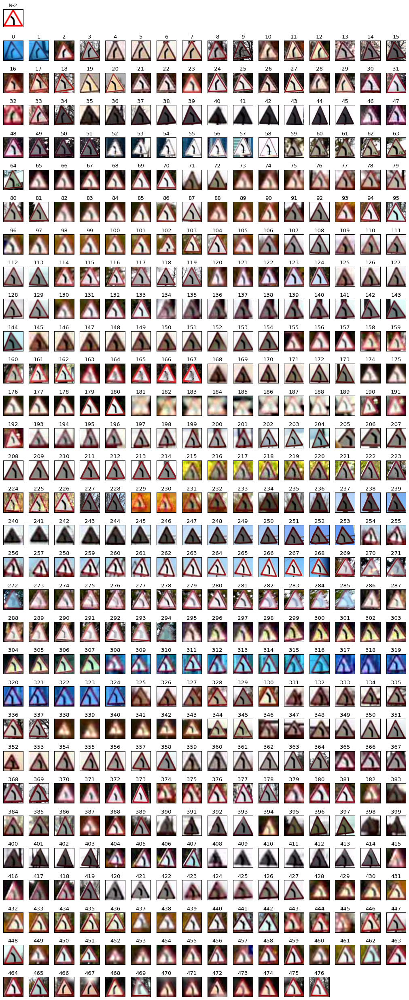

In [9]:
fig = plt.figure()
plt.style.use(['classic'])
imgs_49 = plot_signs_class(fig, labels_df, 49, width, height,
                           save_path=results_path + '/Class_49_en.png')

fig = plt.figure()
plt.style.use(['classic'])
imgs_1 = plot_signs_class(fig, labels_df, 1, width, height,
                          save_path=results_path + '/Class_1_en.png')

fig = plt.figure()
plt.style.use(['classic'])
imgs_2 = plot_signs_class(fig, labels_df, 2, width, height,
                          save_path=results_path + '/Class_2_en.png')

In [0]:
def change_wrong_labels(main_df: pd.DataFrame, class_df: pd.DataFrame, 
                        num_list: list, to_class: int):
    wrong_rows_df = class_df.iloc[num_list]
    # display(wrong_rows_df)
    indicis_of_wrong = wrong_rows_df.index.values
    main_df.iloc[indicis_of_wrong, 
                   main_df.columns.get_loc('class_number')] = to_class
    # display(main_df.iloc[indicis_of_wrong])

def horz_flip_wrong_imgs(all_imgs, class_df, num_list):
    wrong_rows_df = class_df.iloc[num_list]
    indicis_of_wrong = wrong_rows_df.index.values

    for index in indicis_of_wrong:
        # ind = incorrect_classes[index]
        all_imgs[index] = np.fliplr(all_imgs[index])

Some images from classes 1, 2 and 49 have wrong labels or wrong displaying (horizontal flip is needes)

In [0]:
imgs_list_49_horiz_flip = [177, 178, 179, 180, 181, 182]

imgs_list_1_to_2 = [0, 1, 2, 20, 21, 22, 23]

imgs_list_2_to_1 = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 24, 28, 
                      29, 32, 33, 34, 466, 467, 468, 469]

change_wrong_labels(labels_df, imgs_1, imgs_list_1_to_2, 2)

change_wrong_labels(labels_df, imgs_2, imgs_list_2_to_1, 1)

##Preparing for training

###Loading images as numpy.ndarray()

In [0]:
imgs_paths = labels_df['filename'].to_numpy()

# loading images from pathes in temp to numpy.ndarray()
imgs, labels = load_data(imgs_paths, width, height, n_classes=n_classes,
                            num_labels=labels_df['class_number'].to_list())

###Horizontal flip of some wrong images


In [0]:
horz_flip_wrong_imgs(imgs, imgs_49, imgs_list_49_horiz_flip)

###Images train/validation splitting (70% / 30%)

In [14]:
# train / validation splitting
train_X, val_X, train_Y, val_Y = train_test_split(
        imgs, labels,
        train_size=0.7,
        test_size=0.3,
        random_state=20,
        stratify=labels)

print(f'''Train dataset: {train_X.shape} -> Train labels: {train_Y.shape}
Val dataset:   {val_X.shape}   -> Val labels:   {val_Y.shape}''')

# size of rtsd-r1 in GB
print(f'Size of RTSD-r1: {round(train_X.nbytes/1024**3 + val_X.nbytes/1024**3, 2)} GB')
# rtsd-r1/ -> (32983, 48, 48, 3) -> 1.7 GB
# rtsd-r3/ -> (93654, 48, 48, 3) -> 4.82 GB


Train dataset: (23088, 48, 48, 3) -> Train labels: (23088, 67)
Val dataset:   (9895, 48, 48, 3)   -> Val labels:   (9895, 67)
Size of RTSD-r1: 1.7 GB


Another variant of images loading

In [0]:
# imgs_paths = labels_df['filename'].to_numpy()
# class_labels = labels_df['class_number'].to_numpy()
# # train / validation splitting
# train_X_paths, val_X_paths, train_X_targets, val_Y_targets = train_test_split(
#         imgs_paths, class_labels,
#         train_size=0.7,
#         test_size=0.3,
#         random_state=20,
#         stratify=class_labels)

# # loading images from pathes in temp to numpy.ndarray()
# train_X, train_Y = load_data(train_X_paths, width, height, n_classes=n_classes,
#                             num_labels=list(train_X_targets))
# val_X, val_Y = load_data(val_X_paths, width, height, n_classes=n_classes,
#                             num_labels=list(val_Y_targets))

# train_percentages = np.bincount(train_X_targets) / (np.bincount(train_X_targets) + np.bincount(val_Y_targets))
# test_percentages = np.bincount(val_Y_targets) / (np.bincount(train_X_targets) + np.bincount(val_Y_targets))
# plt.figure()
# plt.hist([x1,x2,x3], bins, stacked=True, density=True)
# plt.hist([train_percentages*100, test_percentages*100], 
#          bins=np.arange(0, n_classes), stacked=True)

# print(f'''Train dataset: {train_X.shape} -> Train labels: {train_Y.shape}
# Val dataset:   {val_X.shape}   -> Val labels:   {val_Y.shape}''')

# # size of rtsd-r1 in GB
# print(f'Size of RTSD-r1: {round(train_X.nbytes/1024**3 + val_X.nbytes/1024**3, 2)} GB')
# # rtsd-r1/ -> (32983, 48, 48, 3) -> 1.7 GB
# # rtsd-r3/ -> (93654, 48, 48, 3) -> 4.82 GB

##CNN Model

###Model creating with keras

In [0]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, BatchNormalization
import keras

input_shape = (height, width, channels)  # train_X.shape[1:] -> (48, 48, 3)
chan_dim = -1

model = Sequential()

# model.add(Conv2D(filters=16, kernel_size=(8,8), activation='relu', 
model.add(Conv2D(filters=16, kernel_size=(3, 3), activation='relu', 
                 input_shape=input_shape))

# model.add(BatchNormalization(axis=chan_dim))
# model.add(Conv2D(filters=32, kernel_size=(4,4), activation='relu'))
model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu'))
model.add(BatchNormalization(axis=chan_dim))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.2))

model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(BatchNormalization(axis=chan_dim))
model.add(Conv2D(filters=128, kernel_size=(3, 3), activation='relu'))
model.add(BatchNormalization(axis=chan_dim))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

# fully-connected №1
model.add(Flatten())
model.add(Dense(256, activation='relu'))
# model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

# fully-connected №2
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

# softmax classifier
model.add(Dense(n_classes, activation='softmax'))

model.compile(
    loss='categorical_crossentropy', 
    optimizer='adam', 
    metrics=['accuracy']
)

###Model structure using model.summary()

In [21]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 46, 46, 16)        448       
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 44, 44, 32)        4640      
_________________________________________________________________
batch_normalization_6 (Batch (None, 44, 44, 32)        128       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 22, 22, 32)        0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 22, 22, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 20, 20, 64)        18496     
_________________________________________________________________
batch_normalization_7 (Batch (None, 20, 20, 64)       

##Training №1
Only data from original database without augmentation

###Training process №1

In [22]:
# REQIEREMENTS:
# from keras.callbacks import ModelCheckpoint, EarlyStopping

# condition of stopping the learning avoiding an overfitting
es_callback = EarlyStopping(monitor='val_loss',  # observed value
                            patience=3,  # during this number of epochs the val_loss should increase to stop learning
                            restore_best_weights=True)

# filepath=results_path + "/model-{epoch:02d}-{val_acc:.2f}.hdf5"
filepath=results_path + "/model-train1_new_en.hdf5"

# for saving the model after learning
checkpoint_callback = ModelCheckpoint(filepath=filepath,
                                      monitor='val_loss',
                                      save_best_only=True)

epochs = 100
history = model.fit(train_X, train_Y, batch_size=5000, epochs=epochs,
                    validation_data=(val_X, val_Y),
                    callbacks=[es_callback, checkpoint_callback])


Train on 23088 samples, validate on 9895 samples
Epoch 1/100
23088/23088 [==============================] - 8s 363us/step - loss: 3.6766 - acc: 0.2389 - val_loss: 1.6995 - val_acc: 0.6164
Epoch 2/100
23088/23088 [==============================] - 3s 145us/step - loss: 2.0308 - acc: 0.5471 - val_loss: 1.2246 - val_acc: 0.7048
Epoch 3/100
23088/23088 [==============================] - 3s 144us/step - loss: 1.5581 - acc: 0.6478 - val_loss: 0.9641 - val_acc: 0.7651
Epoch 4/100
23088/23088 [==============================] - 3s 145us/step - loss: 1.2893 - acc: 0.7041 - val_loss: 0.8134 - val_acc: 0.7955
Epoch 5/100
23088/23088 [==============================] - 3s 145us/step - loss: 1.0882 - acc: 0.7479 - val_loss: 0.6825 - val_acc: 0.8273
Epoch 6/100
23088/23088 [==============================] - 3s 145us/step - loss: 0.9478 - acc: 0.7831 - val_loss: 0.6162 - val_acc: 0.8428
Epoch 7/100
23088/23088 [==============================] - 3s 144us/step - loss: 0.8352 - acc: 0.8054 - val_loss: 0.5

If model restore is needed:

In [0]:
from keras.models import  load_model

model = load_model('/content/drive/My Drive/Colab Notebooks/Results/CourseWork/Models/model-train1_new_en.hdf5')

###Training process №1 visualizing

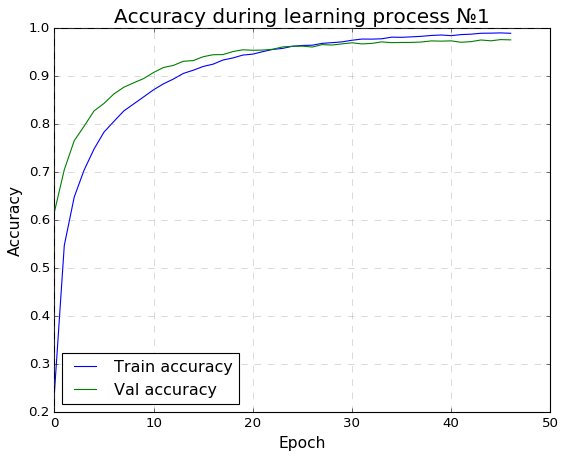

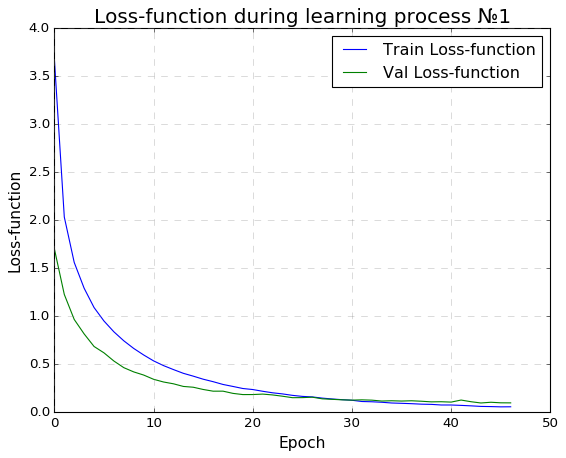

In [23]:
fig0 = plt.figure(0)
plt.style.use(['classic'])
fig0.set_facecolor('w')

plt.plot(history.history['acc'], label='Train accuracy')
plt.plot(history.history['val_acc'], label='Val accuracy')
plt.grid(True, linestyle='--', which='major', color='grey', alpha=0.5)
plt.title('Accuracy during learning process №1', fontsize=18)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend(loc='best')
fig0.savefig(results_path + '/train1_acc_per_epochs_en.png')

# --------------

fig1 = plt.figure(1)
plt.style.use(['classic'])
fig1.set_facecolor('w')

plt.plot(history.history['loss'], label='Train Loss-function')
plt.plot(history.history['val_loss'], label='Val Loss-function')
plt.grid(True, linestyle='--', which='major', color='grey', alpha=0.5)
plt.title('Loss-function during learning process №1', fontsize=18)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss-function', fontsize=14)
plt.legend(loc='best')
fig1.savefig(results_path + '/train1_loss_per_epochs_en.png')

###Training process №1 report

In [0]:
def results_report(data_X, data_Y, save_xlsx_path: str="", batch_size: int=64):
    pred = model.predict(data_X, batch_size=batch_size, verbose=1)

    # Convering label-vector to label number: [0 0 1 0 ... 0] -> 2
    pred_bool = np.argmax(pred, axis=1)

    # Dict with results
    report = classification_report(np.argmax(data_Y, axis=1), pred_bool, 
                                   output_dict=True)
    # DataFreame from dict 
    report_df = pd.DataFrame(report).transpose()

    if save_xlsx_path:  # if save_xlsx_path is not empty
        try:
            report_df.to_excel(save_xlsx_path, sheet_name='Sheet0')
            print(f"Saved to the: {save_xlsx_path}")
        except Exception as e:
            print('ERROR: Unsuccessfull saving')
            print(e)
    return report_df

In [25]:
val_report_df = results_report(val_X, val_Y, save_xlsx_path=results_path + 
                               '/train1_val_report_en.xlsx')
print(val_report_df)
val_eval = model.evaluate(val_X, val_Y)
print(f'loss: {round(val_eval[0], 5)}, acc: {round(val_eval[1], 5)}')


9895/9895 [==============================] - 1s 112us/step
Saved to the: /content/drive/My Drive/Colab Notebooks/Results/CourseWork/EN/train1_val_report_en.xlsx
              precision    recall  f1-score      support
0              0.950820  0.935484  0.943089    62.000000
1              0.935484  0.966667  0.950820   120.000000
2              0.984496  0.920290  0.951311   138.000000
3              0.981818  0.947368  0.964286    57.000000
4              1.000000  0.943396  0.970874    53.000000
...                 ...       ...       ...          ...
65             0.983287  0.988796  0.986034   357.000000
66             0.956522  0.846154  0.897959    52.000000
accuracy       0.975038  0.975038  0.975038     0.975038
macro avg      0.967302  0.935768  0.949879  9895.000000
weighted avg   0.975279  0.975038  0.974802  9895.000000

[70 rows x 4 columns]
9895/9895 [==============================] - 1s 132us/step
loss: 0.09402, acc: 0.97504


###Confusion matrix after training process №1

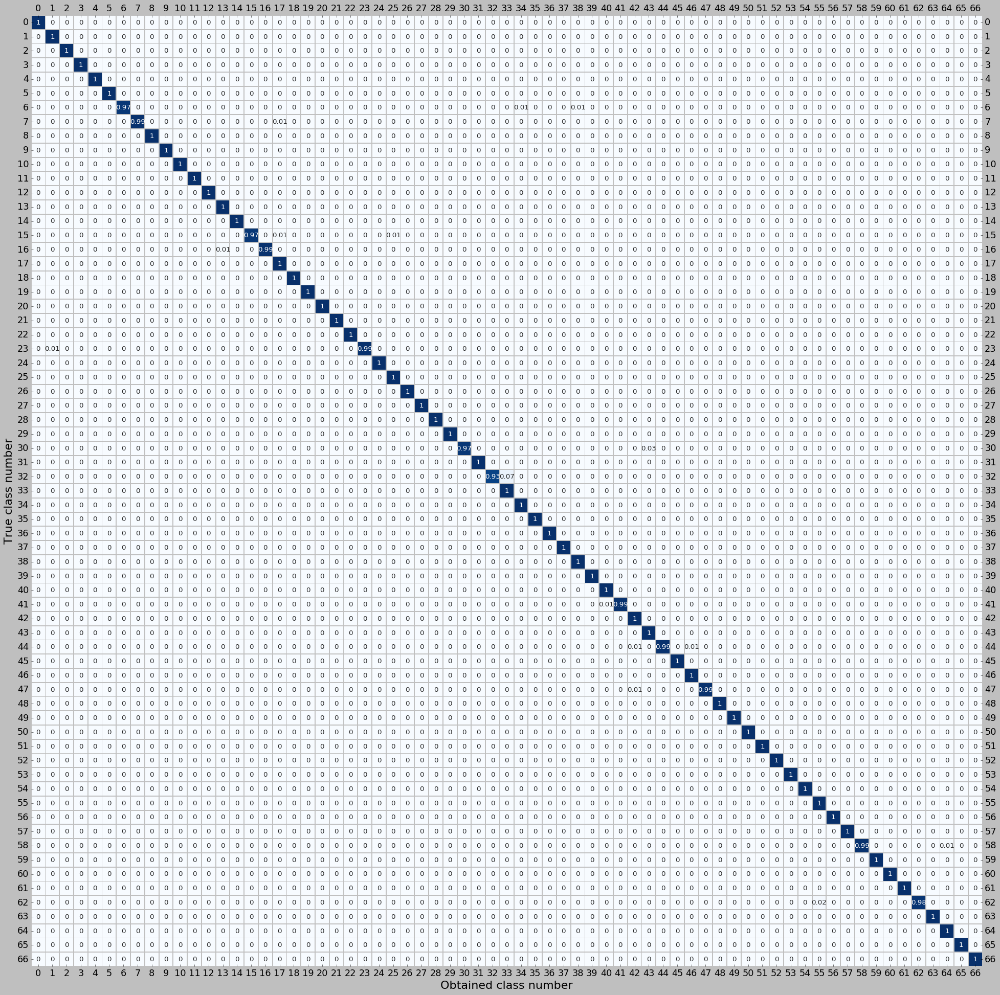

In [26]:
y_pred = model.predict_classes(train_X)
test_Y_classes = np.argmax(train_Y, axis=1)  # labels_vectors -> class_number

con_mat1 = metrics.confusion_matrix(y_true=test_Y_classes, y_pred=y_pred)
con_mat_norm1 = np.around(con_mat1.astype('float') / con_mat1.sum(axis=1)[:, np.newaxis], decimals=2)
 
con_mat_df1 = pd.DataFrame(con_mat_norm1, index = range(n_classes), 
                          columns = range(n_classes))

# sb.set_style(ytick.left=True, ytick.right=True)
fig = plt.figure(figsize=(30, 30))
ax = sb.heatmap(con_mat_df1, square=True,
                 annot=True, linecolor='silver',
                 # center=0,
                 cmap=plt.cm.Blues,
                 # cmap="vlag",
                 linewidths=0.75,
                 cbar=False)

ax.tick_params(labelright=True, left=True, bottom=True, labeltop=True, 
               rotation=0, labelsize=16)
# plt.tight_layout()
plt.ylabel('True class number', fontsize=20)
plt.xlabel('Obtained class number', fontsize=20)
fig.savefig(results_path + '/train1_confusion_matrix_en.png')


##Training №2

###Data augmentation
Example of augmentation working

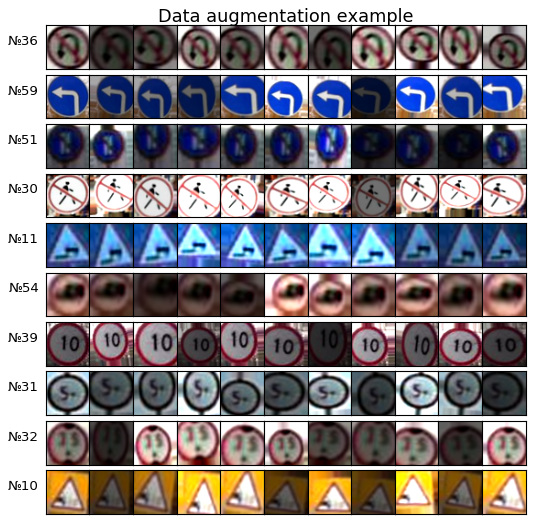

In [27]:
from keras.preprocessing.image import ImageDataGenerator

# ImageDataGenerator's brightness_range is used, so the result image will be [0, 255] scaled
# preprocessing_function is needed to rescale image's pixels data to [0, 1]
def rescaling_func(image):
    return image/255

datagen = ImageDataGenerator(
    rotation_range=8,
	zoom_range=[0.8, 1.2],
	width_shift_range=0.12,
	height_shift_range=0.12,
    brightness_range=[0.3, 1.7],
	fill_mode="nearest",
    preprocessing_function=rescaling_func)  # is applied after all transformations

n_class_examples = 10  # number of rows
n_samples = 10  # number of columns

# choosing last n_class_examples with the least amount of images in RTSD
temp_classes = r1_class_counts.tail(n_class_examples).index.to_numpy()

fig, axes = plt.subplots(nrows=n_class_examples, ncols=n_samples+1,
                         figsize=((n_samples + 2)*0.5, (n_class_examples + 1 + 2)*0.5))

fig.subplots_adjust(left=0, right=1, bottom=0, top=0.95, hspace=0.01, wspace=0)
plt.style.use(['classic'])
fig.set_facecolor('w')

for row_i in range(n_class_examples):

    temp_filter = labels_df["class_number"] == temp_classes[row_i]
    temp = labels_df.where(temp_filter)['filename'].dropna().sample(n=1, random_state=1)
    temp_imgs = load_data(temp.to_numpy(), width, height, n_classes)

    aug_iterator = datagen.flow(temp_imgs, batch_size=n_samples)

    for col_i in range(0, n_samples+1):
        ax = axes[row_i, col_i]
        ax.set_xticks([])
        ax.set_yticks([])
        
        # if the first column, then display the original image from database
        if col_i == 0:
            ax.imshow(temp_imgs[0])
            row_text = '№' + str(temp_classes[row_i])
            ax.set_ylabel(row_text, rotation=0, labelpad=20)

        else:
            aug_img = aug_iterator.next()
            ax.imshow(aug_img[0])

plt.suptitle('Data augmentation example', fontsize=16)
fig.savefig(results_path + '/data_augumentation_example_en.png')

###Training process №2

In [29]:
# condition of stopping the learning avoiding an overfitting
es_callback = EarlyStopping(monitor='val_loss',  # observed value
                            patience=2,  # during this number of epochs the val_loss should increase to stop learning
                            restore_best_weights=True)

# filepath=results_path + "/model-train2-{epoch:02d}-{val_acc:.2f}.hdf5"
filepath=results_path + "/model-train2_new_en.hdf5"

# for saving the model after learning
checkpoint_callback = ModelCheckpoint(filepath=filepath,
                                      monitor='val_loss',
                                      save_best_only=True)

epochs = 15   
history2 = model.fit_generator(datagen.flow(train_X, train_Y, batch_size=16),
                    steps_per_epoch=train_X.shape[0],
                    epochs=epochs,
                    validation_data=(val_X, val_Y),
                    callbacks=[checkpoint_callback, es_callback])


Epoch 1/15
23088/23088 [==============================] - 561s 24ms/step - loss: 0.2590 - acc: 0.9281 - val_loss: 0.0523 - val_acc: 0.9843
Epoch 2/15
23088/23088 [==============================] - 567s 25ms/step - loss: 0.1962 - acc: 0.9449 - val_loss: 0.0387 - val_acc: 0.9891
Epoch 3/15
23088/23088 [==============================] - 551s 24ms/step - loss: 0.1622 - acc: 0.9543 - val_loss: 0.0312 - val_acc: 0.9919
Epoch 4/15
23088/23088 [==============================] - 519s 22ms/step - loss: 0.1430 - acc: 0.9592 - val_loss: 0.0324 - val_acc: 0.9913
Epoch 5/15
23088/23088 [==============================] - 506s 22ms/step - loss: 0.1289 - acc: 0.9632 - val_loss: 0.0305 - val_acc: 0.9914
Epoch 6/15
23088/23088 [==============================] - 508s 22ms/step - loss: 0.1165 - acc: 0.9665 - val_loss: 0.0253 - val_acc: 0.9930
Epoch 7/15
23088/23088 [==============================] - 505s 22ms/step - loss: 0.1070 - acc: 0.9693 - val_loss: 0.0223 - val_acc: 0.9941
Epoch 8/15
23088/23088 [===

If model restore is needed:

In [0]:
from keras.models import  load_model

model = load_model('/content/drive/My Drive/Colab Notebooks/Results/CourseWork/EN/model-train2_new_en.hdf5')

###Training process №2 visualizing

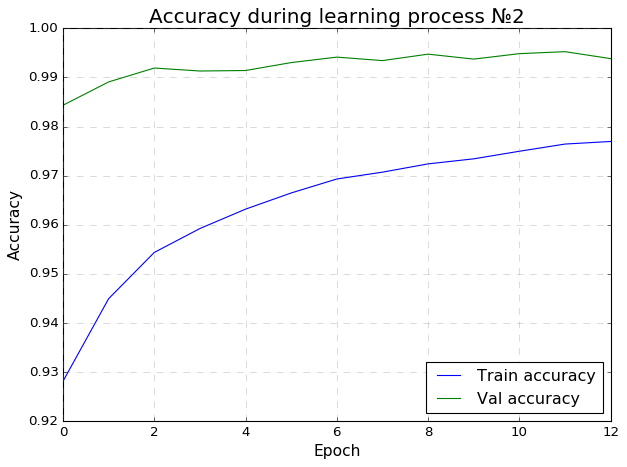

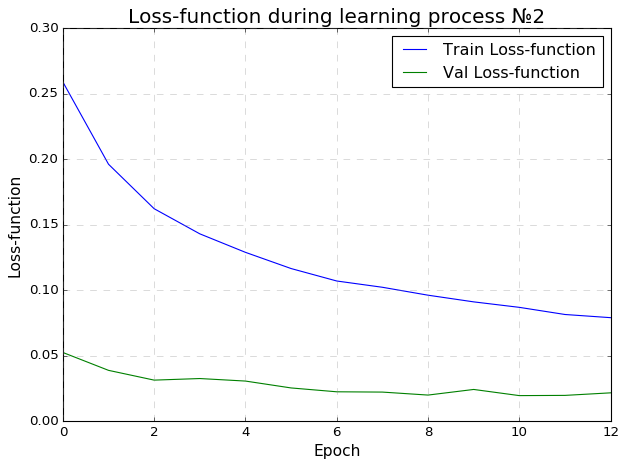

In [32]:
fig2 = plt.figure(2)
plt.style.use(['classic'])
fig2.set_facecolor('w')

plt.plot(history2.history['acc'], label='Train accuracy')
plt.plot(history2.history['val_acc'], label='Val accuracy')
plt.grid(True, linestyle='--', which='major', color='grey', alpha=0.5)
plt.title('Accuracy during learning process №2', fontsize=18)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend(loc='best')
plt.tight_layout()
fig2.savefig(results_path + '/train2_acc_per_epochs_en.png')

# --------------

fig3 = plt.figure(3)
plt.style.use(['classic'])
fig3.set_facecolor('w')

plt.plot(history2.history['loss'], label='Train Loss-function')
plt.plot(history2.history['val_loss'], label='Val Loss-function')
plt.grid(True, linestyle='--', which='major', color='grey', alpha=0.5)
plt.title('Loss-function during learning process №2', fontsize=18)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss-function', fontsize=14)
plt.legend(loc='best')
plt.tight_layout()
fig3.savefig(results_path + '/train2_loss_per_epochs_en.png')

###Training process №2 report

In [33]:
val_report_df = results_report(val_X, val_Y, save_xlsx_path=results_path + 
                               '/train2_val_report_en.xlsx')
print(val_report_df)
val_eval = model.evaluate(val_X, val_Y)
print(f'loss: {round(val_eval[0], 5)}, acc: {round(val_eval[1], 5)}')

9895/9895 [==============================] - 1s 83us/step
Saved to the: /content/drive/My Drive/Colab Notebooks/Results/CourseWork/EN/train2_val_report_en.xlsx
              precision    recall  f1-score      support
0              1.000000  1.000000  1.000000    62.000000
1              0.983607  1.000000  0.991736   120.000000
2              1.000000  0.978261  0.989011   138.000000
3              1.000000  1.000000  1.000000    57.000000
4              1.000000  0.981132  0.990476    53.000000
...                 ...       ...       ...          ...
65             1.000000  0.997199  0.998597   357.000000
66             1.000000  0.980769  0.990291    52.000000
accuracy       0.994846  0.994846  0.994846     0.994846
macro avg      0.992721  0.988421  0.990336  9895.000000
weighted avg   0.994898  0.994846  0.994832  9895.000000

[70 rows x 4 columns]
9895/9895 [==============================] - 1s 124us/step
loss: 0.0194, acc: 0.99485


###Confusion matrix after training process №2

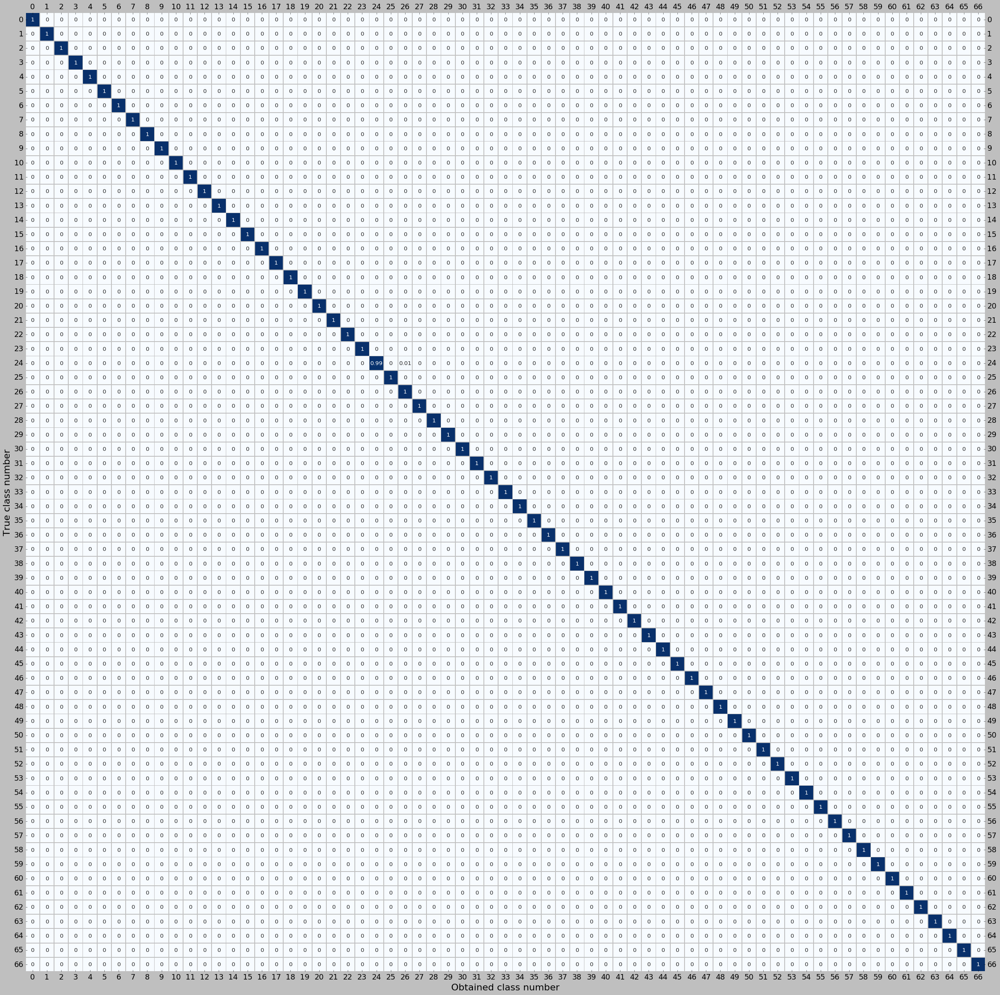

In [34]:
y_pred = model.predict_classes(train_X)
test_Y_classes = np.argmax(train_Y, axis=1)  # labels_vectors -> class_number

con_mat2 = metrics.confusion_matrix(y_true=test_Y_classes, y_pred=y_pred)
con_mat_norm2 = np.around(con_mat2.astype('float') / con_mat2.sum(axis=1)[:, np.newaxis], decimals=2)
 
con_mat_df2 = pd.DataFrame(con_mat_norm2, index = range(n_classes), 
                          columns = range(n_classes))

fig = plt.figure(figsize=(30, 30))
# fig.set_facecolor('w')
ax = sb.heatmap(con_mat_df2, square=True,
                 annot=True, linecolor='silver',
                 # center=0,
                 cmap=plt.cm.Blues,
                 # cmap="vlag",
                 linewidths=0.75,
                 cbar=False)

ax.tick_params(labelright=True, left=True, bottom=True, labeltop=True, 
               rotation=0, labelsize=16)
plt.ylabel('True class number', fontsize=20)
plt.xlabel('Obtained class number', fontsize=20)
plt.tight_layout()
fig.savefig(results_path + '/train2_confusion_matrix_en.png')

##Results visualising

Function to plot horizontal bars with top N predictions of classes with comparing the original signs

In [0]:
def plot_fancy_signs_bar(df_classes, orig_signs_folder_path, ax, xlims,
                         zoom: int=0.45, delta_w: int=500, 
                         labels_fontsize: int=16, x_increase=1.3, 
                         green_condition: list=[]):

    y_bar_nums = df_classes.index.astype(str)

    if green_condition:
        colors = []
        edgecolors = []
        for i, bar_num in enumerate(y_bar_nums):
            
            if str(green_condition[0]) == str(bar_num):  # right predictions
                colors.append('lightseagreen')
                edgecolors.append('lightseagreen')
            else:  # wrong predictions
                colors.append('tomato')
                edgecolors.append('tomato')

    else:
        colors = 'lightseagreen'
        edgecolors = 'lightseagreen'

    y_bar_labels = (('№' + y_bar_nums).to_numpy(dtype=str))
    x_bar_labels = df_classes[0].to_numpy()

    bar_graphs = ax.barh(y_bar_labels, x_bar_labels, 0.8, 
                     edgecolor=edgecolors, 
                     color=colors, alpha=0.8)

    ax.xaxis.grid(True, linestyle='--', which='major', color='grey', alpha=0.5)

    # 30% x ixis zooming on right
    ax.set_xlim((xlims[0], xlims[1]*x_increase))

    ymin, ymax = ax.get_ylim()
    ax.set_ylim(bottom=ymin-1, top=ymax+1)

    for i, bar in enumerate(bar_graphs):
        # bar - is an object of Rectangle class
        # Rectangle class has methods like get_width(), get_height(), etc...
        w, h = bar.get_width(), bar.get_height()

        # coordinates of left bottom edge        
        x0, y0 = bar.xy

        # display the original icons of traffic signs
        path = orig_signs_folder_path + '/' + y_bar_nums[i] + '.jpg'
        arr_img = mpimg.imread(path)
        imagebox = OffsetImage(arr_img, zoom=zoom)

        ab = AnnotationBbox(imagebox, (x0 + w + delta_w, y0 + h/2), frameon=False)
        ax.add_artist(ab)

        # probability labels in percents
        label = round(x_bar_labels[i]*100, 3)
        ax.text(x = x0 + w + 0.01, y = y0 + h/4, s = label, size = 12)
    

###New random traffic signs images from internet results

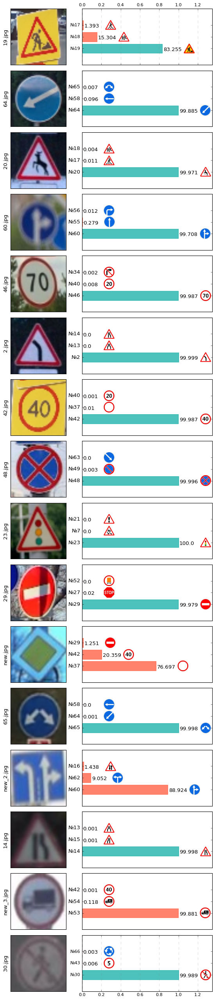

In [36]:
import os

orig_signs_folder_path = '/content/drive/My Drive/Colab Notebooks/Bases/signs_original'

# path to folder with new images
examples_path = '/content/drive/My Drive/Colab Notebooks/Bases/signs_classification_examples/'
examples_names = np.asarray(os.listdir(examples_path), dtype=np.str)

n_examples = examples_names.shape[0]

# element wise uniting of path and files names
example_X_paths = np.core.defchararray.add(examples_path, examples_names)

# loading images data from paths to numpy.ndarray()
example_X = load_data(example_X_paths, width, height)

pred_examples_outputs = model.predict(example_X)
pred_examples_labels = np.argmax(pred_examples_outputs, axis=1)

fig, axes = plt.subplots(nrows=n_examples, ncols=2, 
                         figsize=(8, n_examples*2))

fig.subplots_adjust(left=0, right=1, bottom=0.2, top=0.95, hspace=0.1, wspace=0.01)
plt.style.use(['classic'])
fig.set_facecolor('w')

for i_row in range(n_examples):

    df_class = pd.DataFrame(data=pred_examples_outputs[i_row],
                            index=range(n_classes))

    df_class = df_class.sort_values(0, ascending=False).head(3)

    for i_col in range(2):

        ax = axes[i_row, i_col]

        if i_col == 0:  # first column
            ax.imshow(example_X[i_row])
            ax.set_ylabel(examples_names[i_row])
            ax.set_xticks([])
            ax.set_yticks([])

        else:  # second column
            plot_fancy_signs_bar(df_class, orig_signs_folder_path, ax, xlims=[0, 1],
                                 delta_w = 0.28, x_increase=1.35, zoom=0.5,
                                 green_condition=[examples_names[i_row].split(sep='.')[0]])
            
            if i_row == 0:
                ax.tick_params(labeltop=True, labelbottom=False, labelsize=10)
            elif i_row == n_examples-1:
                ax.tick_params(bottom=True, labeltop=False, labelsize=10)
            else:
                ax.set_xticks([])

plt.tight_layout()
fig.savefig(results_path + '/results_examples_1_en.png')

###Validation dataset errors visualization

Number of wrong results: 51


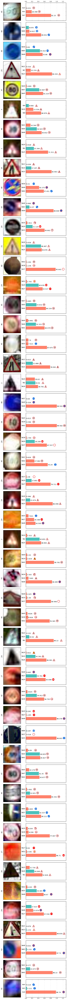

In [38]:
orig_signs_folder_path = '/content/drive/My Drive/Colab Notebooks/Bases/signs_original'

v_pred_classes = model.predict_classes(val_X)  

# номер изображения, где 
img_labels = np.argmax(val_Y, axis=1)

# wrong images classification indexes
incorrect_classes = np.where(v_pred_classes != img_labels)[0]
print(f'Number of wrong results: {val_X[incorrect_classes].shape[0]}')

# выборка (неверно определенных) изображений и их распознанных классов
example_X = val_X[incorrect_classes] 
example_Y = img_labels[incorrect_classes]

n_examples = example_X.shape[0]
pred_examples_outputs = model.predict(example_X)

# incorrect_file_paths = val_X_paths[incorrect_classes]
# file_names = []
# for row in incorrect_file_paths:
#     file_names.append(row.split('/')[-1])
# pred_examples_labels = np.argmax(pred_examples_outputs, axis=1)
# plt.imshow(example_X[0])
fig, axes = plt.subplots(nrows=n_examples, ncols=2, 
                         figsize=(8, n_examples*2))

fig.subplots_adjust(left=0, right=1, bottom=0.2, top=0.95, hspace=0.1, wspace=0.05)
plt.style.use(['classic'])
fig.set_facecolor('w')

for i_row in range(n_examples):

    df_class = pd.DataFrame(data=pred_examples_outputs[i_row],
                            index=range(n_classes))

    df_class = df_class.sort_values(0, ascending=False).head(3)

    for i_col in range(2):

        ax = axes[i_row, i_col]

        if i_col == 0:
            # print(example_X[i_row])
            ax.imshow(example_X[i_row])
            # ax.set_ylabel(str(example_Y[i_row]) + ': ' + file_names[i_row])
            ax.set_ylabel(str(example_Y[i_row]))
            ax.set_xticks([])
            ax.set_yticks([])

        else:

            plot_fancy_signs_bar(df_class, orig_signs_folder_path, ax, xlims=[0, 1],
                                 delta_w = 0.25, x_increase=1.3, zoom=0.35,
                                 green_condition=[example_Y[i_row]]) 
            
            if i_row == 0:
                ax.tick_params(labeltop=True, labelbottom=False, labelsize=10)
            elif i_row == n_examples-1:
                ax.tick_params(bottom=True, labeltop=False, labelsize=10)
            else:
                ax.set_xticks([])

plt.tight_layout()
fig.savefig(results_path + '/incorrect_val_results_examples_new_en.png')

###Train dataset errors visualisation

Number of train dataset: 23088
Number of wrong results: 9


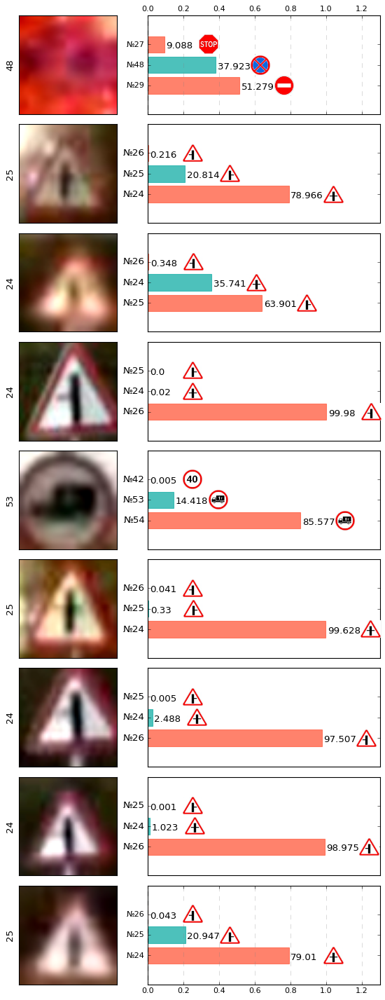

In [39]:
print(f'Number of train dataset: {train_X.shape[0]}')
train_pred_classes = model.predict_classes(train_X)  
img_labels = np.argmax(train_Y, axis=1)

# wrong images classification indexes
incorrect_classes = np.where(train_pred_classes != img_labels)[0]
print(f'Number of wrong results: {train_X[incorrect_classes].shape[0]}')

# wrong predicted images and their labels
example_X = train_X[incorrect_classes] 
example_Y = img_labels[incorrect_classes]

n_examples = example_X.shape[0]
pred_examples_outputs = model.predict(example_X)

# incorrect_file_paths = train_X_paths[incorrect_classes]
# file_names = []
# for row in incorrect_file_paths:
#     file_names.append(row.split('/')[-1])

fig, axes = plt.subplots(nrows=n_examples, ncols=2, 
                         figsize=(8, n_examples*2))

fig.subplots_adjust(left=0, right=1, bottom=0.2, top=0.95, hspace=0.1, wspace=0.05)
plt.style.use(['classic'])
fig.set_facecolor('w')

for i_row in range(n_examples):

    df_class = pd.DataFrame(data=pred_examples_outputs[i_row],
                            index=range(n_classes))

    df_class = df_class.sort_values(0, ascending=False).head(3)

    for i_col in range(2):

        ax = axes[i_row, i_col]

        if i_col == 0:
            # print(example_X[i_row])
            ax.imshow(example_X[i_row])
            # ax.set_ylabel(str(example_Y[i_row]) + ': ' + file_names[i_row])
            ax.set_ylabel(str(example_Y[i_row]))
            ax.set_xticks([])
            ax.set_yticks([])

        else:

            plot_fancy_signs_bar(df_class, orig_signs_folder_path, ax, xlims=[0, 1],
                                 delta_w = 0.25, x_increase=1.3, zoom=0.5,
                                 green_condition=[example_Y[i_row]]) 
            
            if i_row == 0:
                ax.tick_params(labeltop=True, labelbottom=False, labelsize=10)
            elif i_row == n_examples-1:
                ax.tick_params(bottom=True, labeltop=False, labelsize=10)
            else:
                ax.set_xticks([])

plt.tight_layout()
fig.savefig(results_path + '/incorrect_train_results_examples_new_en.png')